# HousePricePred

Data set of House Price prediction is an Supervised Regression model, were we need to predict the House Price. The data set contains 1460 records with 81 features. Our main goal is to train different algorithms based on the dataset so when a new record is fed, our best performing regressor can be used to predict.

# Import required libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

# Importing dataset to jupyter notebook using pandas library

In [2]:
data = pd.read_csv(r"C:\Users\saipr\OneDrive\Desktop\PRCP-1020-HousePricePred (1)\Data\data.csv")

In [3]:
data

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,142125


##### Checking shape of the data set

In [4]:
data.shape

(1460, 81)

### Features description  

# Display max columns

In [5]:
pd.set_option('display.max_columns', None)

In [6]:
data

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1999,2000,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,953,953,GasA,Ex,Y,SBrkr,953,694,0,1647,0,0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1999.0,RFn,2,460,TA,TA,Y,0,40,0,0,0,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1978,1988,Gable,CompShg,Plywood,Plywood,Stone,119.0,TA,TA,CBlock,Gd,TA,No,ALQ,790,Rec,163,589,1542,GasA,TA,Y,SBrkr,2073,0,0,2073,1,0,2,0,3,1,TA,7,Min1,2,TA,Attchd,1978.0,Unf,2,500,TA,TA,Y,349,0,0,0,0,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,9,1941,2006,Gable,CompShg,CemntBd,CmentBd,None,0.0,Ex,Gd,Stone,TA,Gd,No,GLQ,275,Unf,0,877,1152,GasA,Ex,Y,SBrkr,1188,1152,0,2340,0,0,2,0,4,1,Gd,9,Typ,2,Gd,Attchd,1941.0,RFn,1,252,TA,TA,Y,0,60,0,0,0,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,6,1950,1996,Hip,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,Mn,GLQ,49,Rec,1029,0,1078,Gas

# Basic Checks

#### To check feature names

In [7]:
data.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

#### Check the info of the data to understand the summary of the dataframe along with the memory usage

In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

#### Describe gives us the count, mean, standard deviation, minimum, 25% percentile, 50% percentile, 75% percentile and max of the numerical features

In [9]:
data.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1379.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1978.506164,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,24.689725,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [10]:
data.describe(include='O')

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
count,1460,1460,91,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1452,1460,1460,1460,1423,1423,1422,1423,1422,1460,1460,1460,1459,1460,1460,770,1379,1379,1379,1379,1460,7,281,54,1460,1460
unique,5,2,2,4,4,2,5,3,25,9,8,5,8,6,8,15,16,4,4,5,6,4,4,4,6,6,6,5,2,5,4,7,5,6,3,5,5,3,3,4,4,9,6
top,RL,Pave,Grvl,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,Gable,CompShg,VinylSd,VinylSd,None,TA,TA,PConc,TA,TA,No,Unf,Unf,GasA,Ex,Y,SBrkr,TA,Typ,Gd,Attchd,Unf,TA,TA,Y,Gd,MnPrv,Shed,WD,Normal
freq,1151,1454,50,925,1311,1459,1052,1382,225,1260,1445,1220,726,1141,1434,515,504,864,906,1282,647,649,1311,953,430,1256,1428,741,1365,1334,735,1360,380,870,605,1311,1326,1340,3,157,49,1267,1198


#### Check unique values of each features

In [11]:
pd.set_option('display.max_rows', None)
data.nunique()

Id               1460
MSSubClass         15
MSZoning            5
LotFrontage       110
LotArea          1073
Street              2
Alley               2
LotShape            4
LandContour         4
Utilities           2
LotConfig           5
LandSlope           3
Neighborhood       25
Condition1          9
Condition2          8
BldgType            5
HouseStyle          8
OverallQual        10
OverallCond         9
YearBuilt         112
YearRemodAdd       61
RoofStyle           6
RoofMatl            8
Exterior1st        15
Exterior2nd        16
MasVnrType          4
MasVnrArea        327
ExterQual           4
ExterCond           5
Foundation          6
BsmtQual            4
BsmtCond            4
BsmtExposure        4
BsmtFinType1        6
BsmtFinSF1        637
BsmtFinType2        6
BsmtFinSF2        144
BsmtUnfSF         780
TotalBsmtSF       721
Heating             6
HeatingQC           5
CentralAir          2
Electrical          5
1stFlrSF          753
2ndFlrSF          417
LowQualFin

# Exploratory Data Analysis (EDA)

#### --> Univarient Analysis

- Distribution of Sale Price

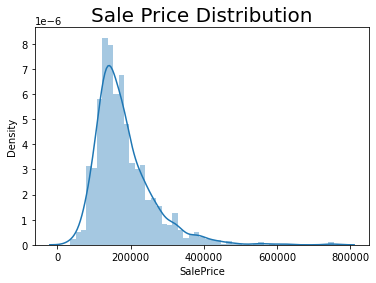

In [12]:
sns.distplot(x = data['SalePrice'])
plt.title('Sale Price Distribution', fontsize = 20);
plt.xlabel('SalePrice', fontsize = 10)
plt.show()

We find that the data is of Right Skewed

In [13]:
print('Skewness of Sale Price: ', data['SalePrice'].skew())
print('Kurtosis of Sale Price: ', data['SalePrice'].kurt())

Skewness of Sale Price:  1.8828757597682129
Kurtosis of Sale Price:  6.536281860064529


- Sale Price VS Total Basement

<AxesSubplot:xlabel='SalePrice', ylabel='TotalBsmtSF'>

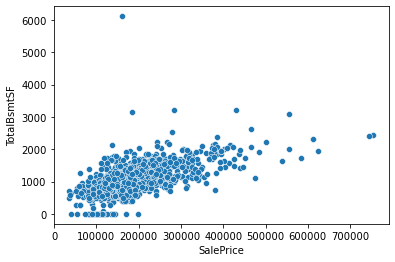

In [14]:
sns.scatterplot(x = data['SalePrice'], y = data['TotalBsmtSF'])

- Sale Price VS Ground Living Area

<AxesSubplot:xlabel='SalePrice', ylabel='GrLivArea'>

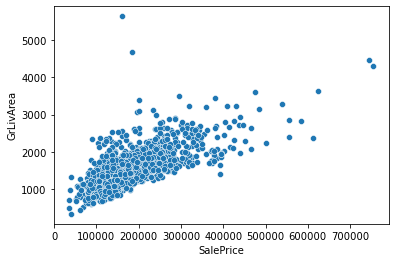

In [15]:
sns.scatterplot(x = data['SalePrice'], y = data['GrLivArea'])

- Sale Price VS Building Dwelling Type hue with House Dwelling Style

<AxesSubplot:xlabel='SalePrice', ylabel='BldgType'>

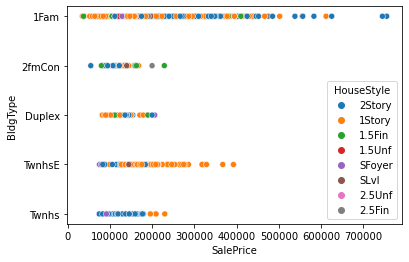

In [16]:
sns.scatterplot(x = data['SalePrice'], y = data['BldgType'], hue = data['HouseStyle'])

- Sale Price VS Year Built

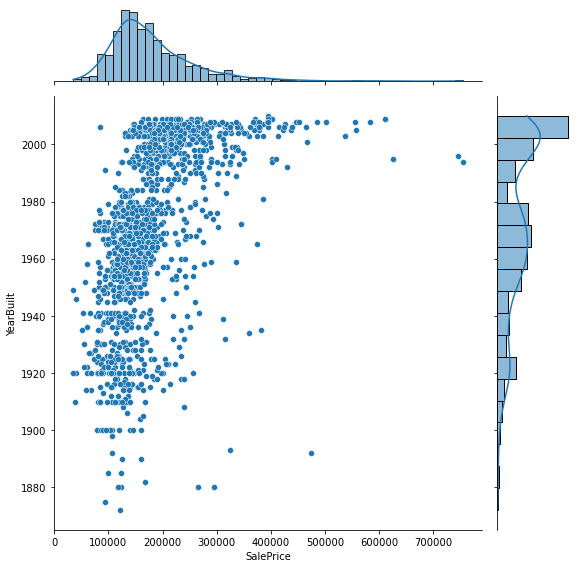

In [17]:
sns.jointplot(x = data['SalePrice'], y = data['YearBuilt'], height = 8, marginal_kws={'kde':True})

- Sale Price VS Overall Quality hue with Condition

<AxesSubplot:xlabel='SalePrice', ylabel='OverallQual'>

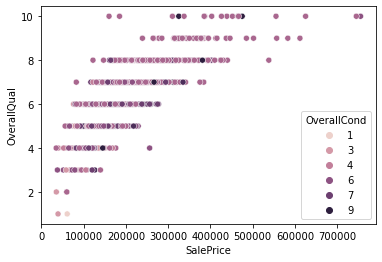

In [18]:
sns.scatterplot(x = data['SalePrice'], y = data['OverallQual'], hue = data['OverallCond'])

- Sweetviz

                                             |                                             | [  0%]   00:00 ->…


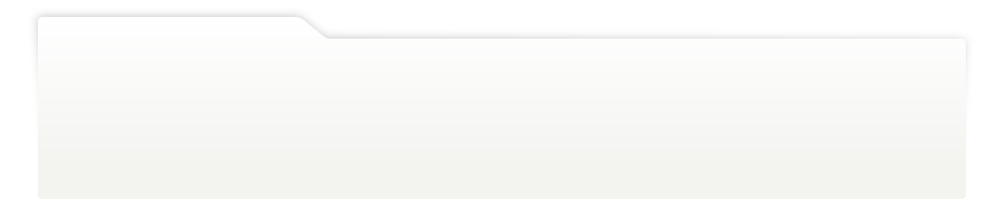
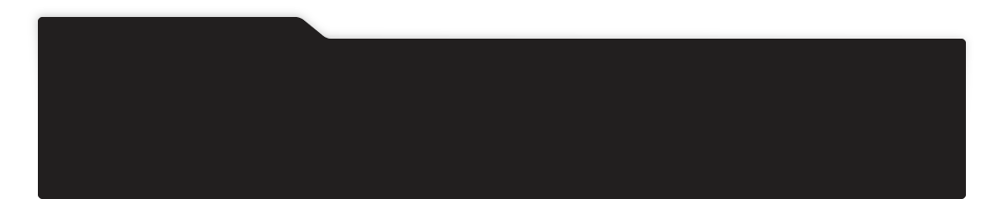
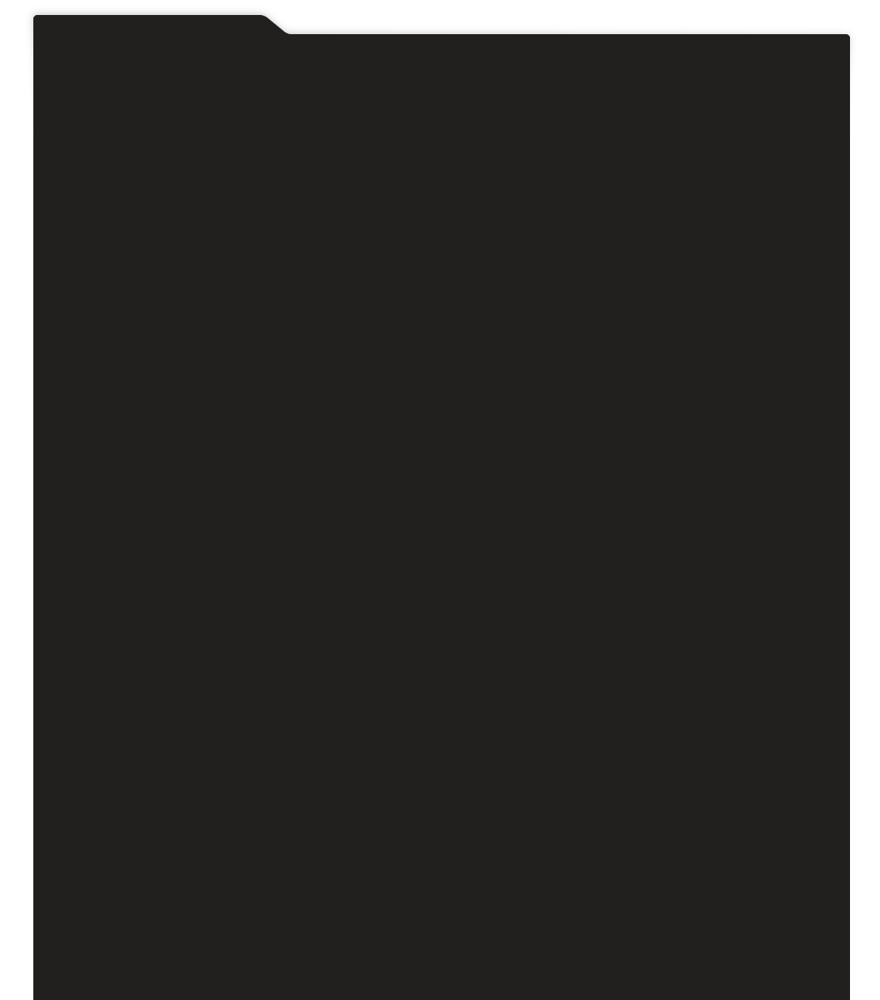
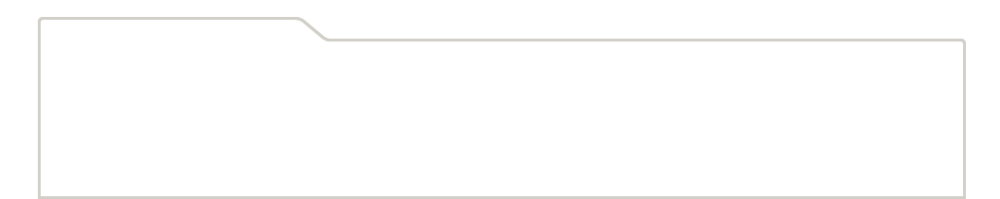
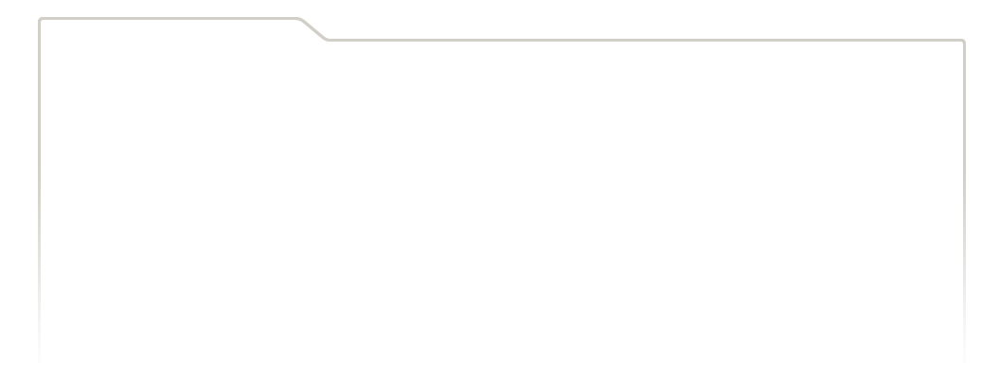
...
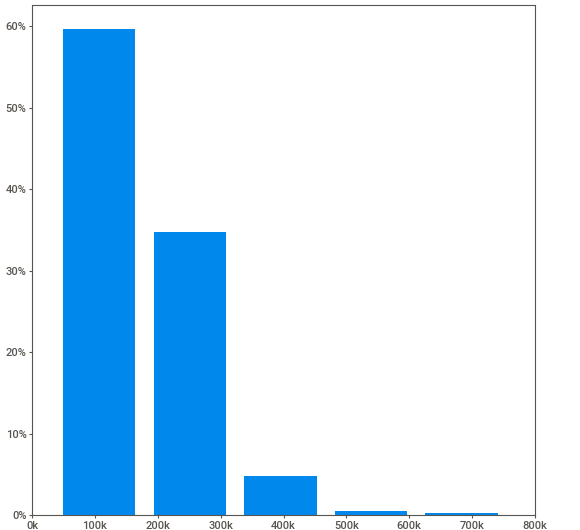
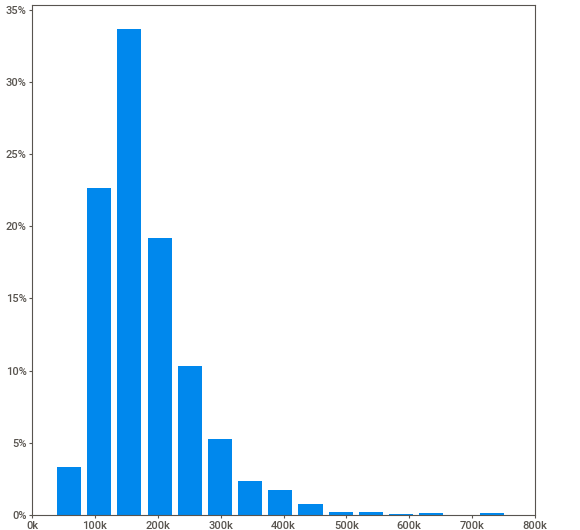
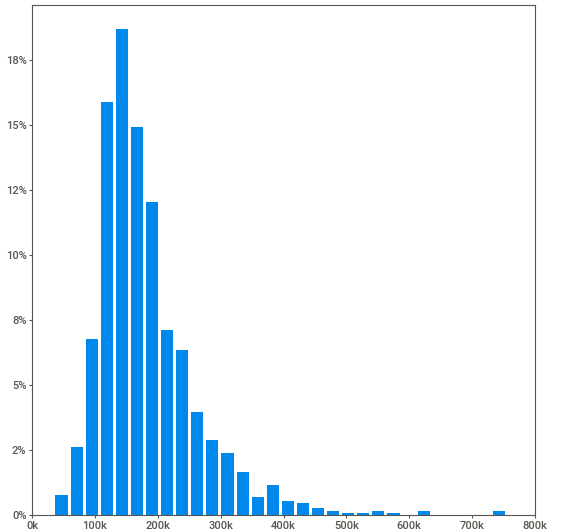
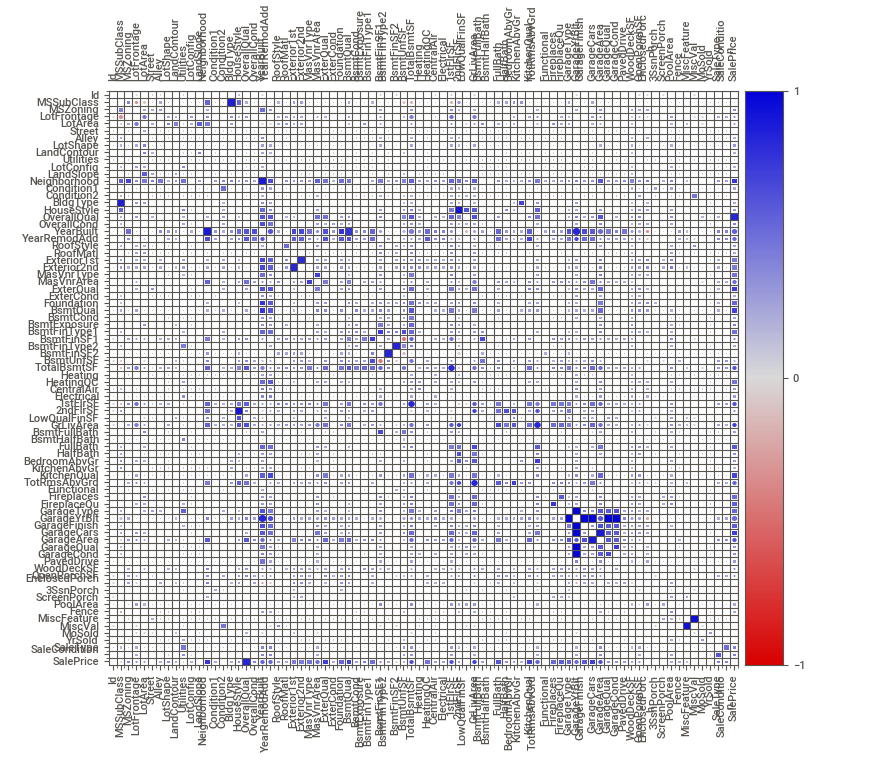
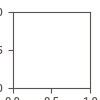

In [19]:
import sweetviz as sv
my_report = sv.analyze(data)
my_report.show_notebook()

- Object Datatypes

In [20]:
dtype_objects = list(columns for columns in data.select_dtypes([object]).columns)

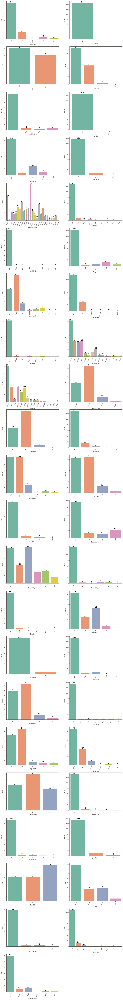

In [21]:
# Countplot for datatype with objects

plt.figure(figsize=(15,150))
plotnumber=1
for c in dtype_objects:
    ax=plt.subplot(25,2,plotnumber)
    b= sns.countplot(x=data[c],palette='Set2')
    plt.xticks(rotation=70)
    plotnumber+=1
    for bar in b.patches:
        b.annotate(format(bar.get_height()),
            (bar.get_x() + bar.get_width() / 2,bar.get_height()), ha='center', va='center',
            size=10, xytext=(0, 6),textcoords='offset points')
plt.show()

- Numeric Datatypes

In [22]:
dtype_float =list(columns for columns in data.select_dtypes([float]).columns)
dtype_int =list(columns for columns in data.select_dtypes([int]).columns)
dtype_num=dtype_float+dtype_int

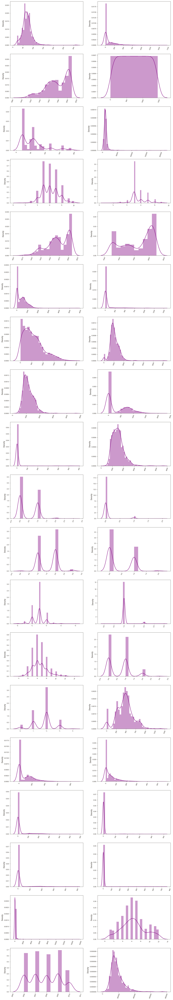

In [23]:
# Distribution plot 

plt.figure(figsize=(15,150))
plotnumber=1
for a in dtype_num:
    ax=plt.subplot(30,2,plotnumber)
    sns.distplot(x=data[a],color='purple')
    plt.xticks(rotation=70)
    plotnumber+=1
plt.show() 

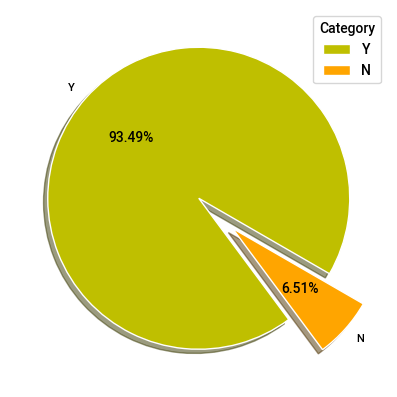

In [24]:
# Pie plot for CentralAir

plt.figure(figsize=(5,5))
plt.pie(data['CentralAir'].value_counts(),labels=['Y','N'],colors=['y','orange'],explode=[0,0.3],autopct='%.2f%%',
shadow = True,startangle = -30,wedgeprops= {'edgecolor':'white','linewidth':1})
plt.legend(labels=['Y','N'],loc="upper right",title='Category') ## used to label at the side
plt.show()

 From the graph 93.49% houses has CentralAir and 6.51% houses has no CentralAir

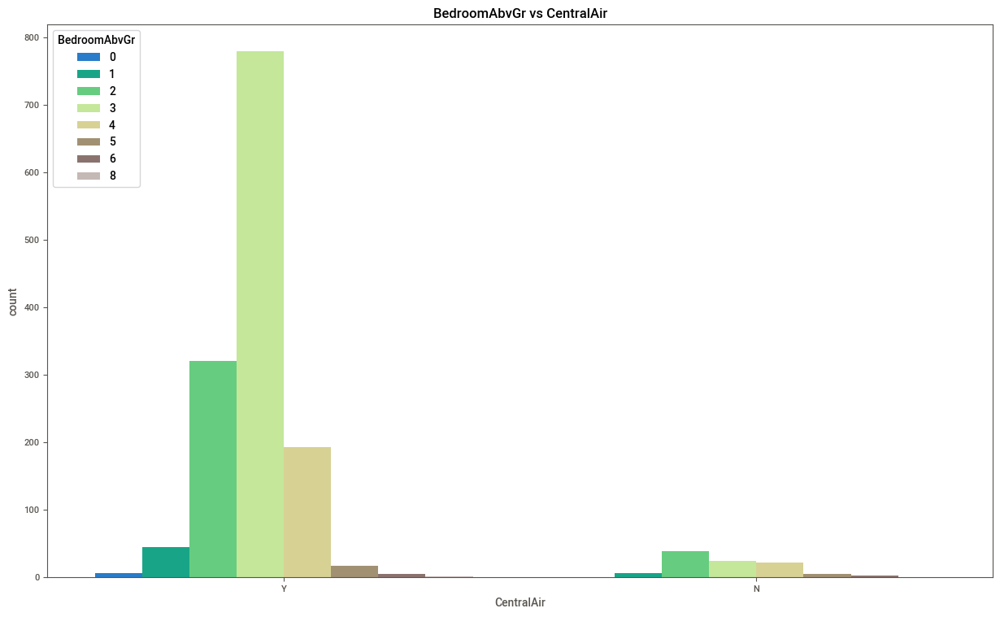

In [25]:
# Countplot for CentralAir and BedroomAbvGr

plt.figure(figsize=(15,9))
sns.countplot(x='CentralAir',hue='BedroomAbvGr',palette='terrain',data=data).set(title="BedroomAbvGr vs CentralAir")
plt.show()

The houses with 3 bedrooms has more central air conditioning than others.

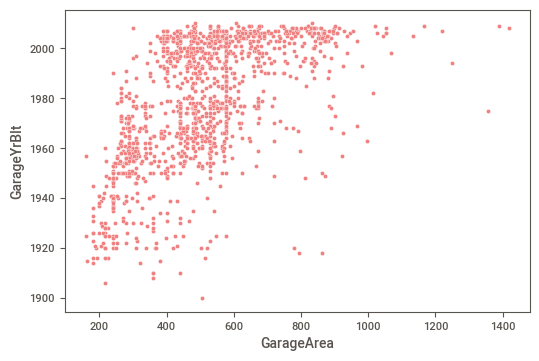

In [26]:
# Scatter plot for GarageArea and GarageYrBlt

sns.scatterplot(x='GarageArea',y='GarageYrBlt',data=data,color='lightcoral')
plt.show()

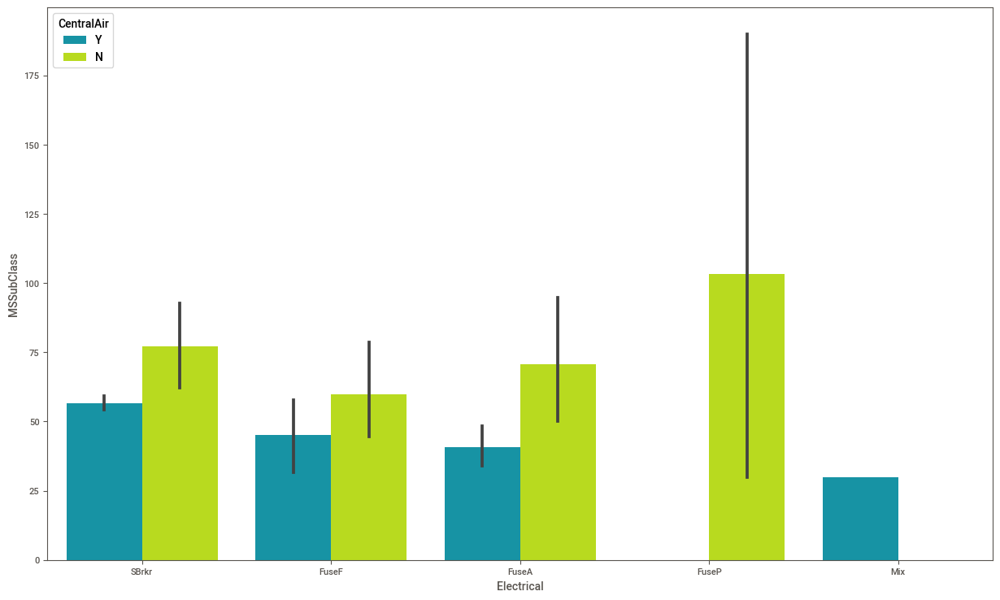

In [27]:
#Multivarient graph.
# Bar plot for Electrical,MSSubClass,CentralAir

plt.figure(figsize=(15,9))
splot=sns.barplot(x='Electrical',y='MSSubClass',hue='CentralAir',palette='nipy_spectral',data=data)
plt.show()

Building with 2-STORY 1946 & NEWER and Standard Circuit Breakers & Romex use more central air conditioning than others.

# Data Preprocessing

#### Checking Duplicate

In [28]:
data.duplicated().sum()

0

#### Checking Null Values

In [29]:
data.isnull().sum()

Id                  0
MSSubClass          0
MSZoning            0
LotFrontage       259
LotArea             0
Street              0
Alley            1369
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType          8
MasVnrArea          8
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           37
BsmtCond           37
BsmtExposure       38
BsmtFinType1       37
BsmtFinSF1          0
BsmtFinType2       38
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          1
1stFlrSF            0
2ndFlrSF            0
LowQualFin

<AxesSubplot:>

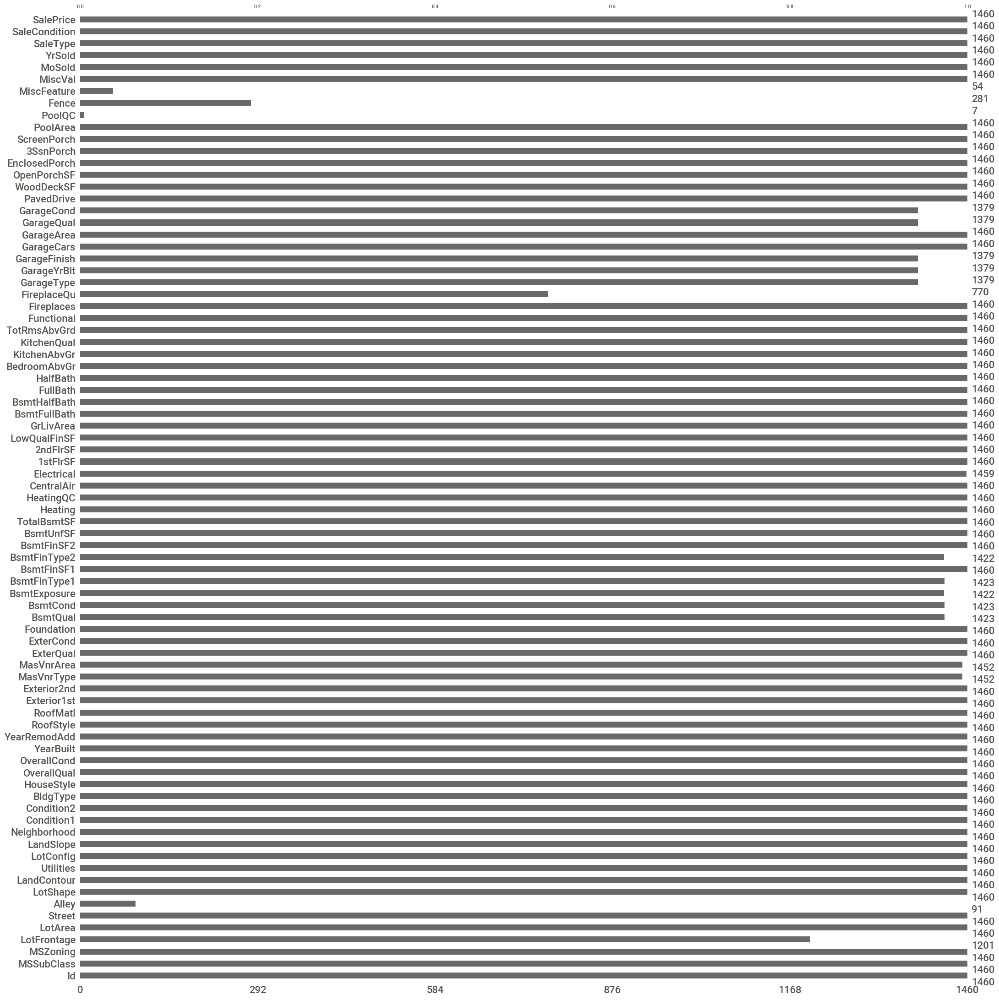

In [30]:
import missingno as msno
msno.bar(data)

<AxesSubplot:>

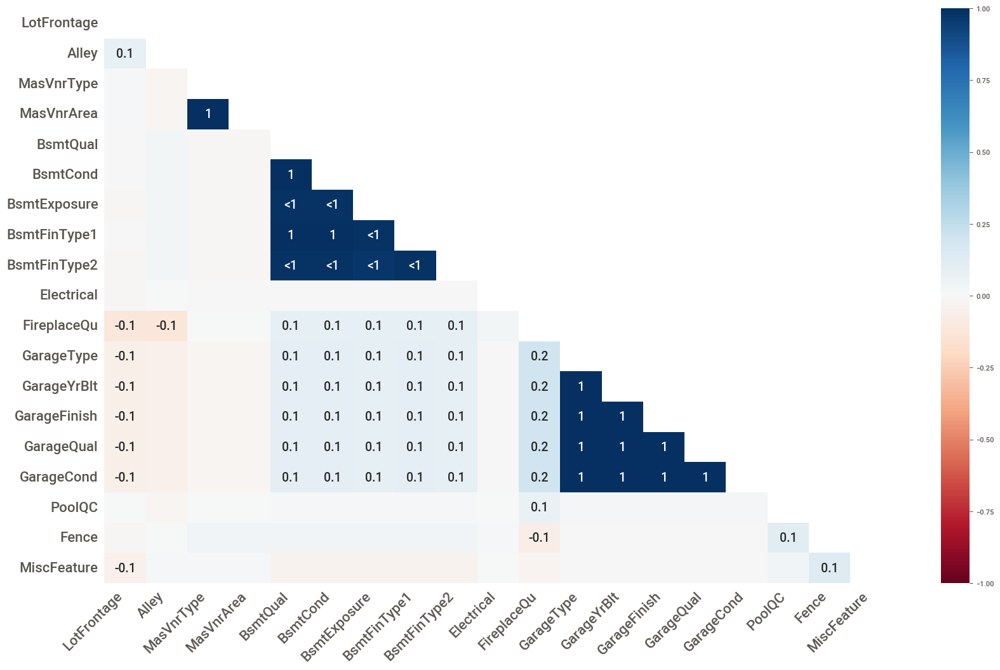

In [31]:
msno.heatmap(data)

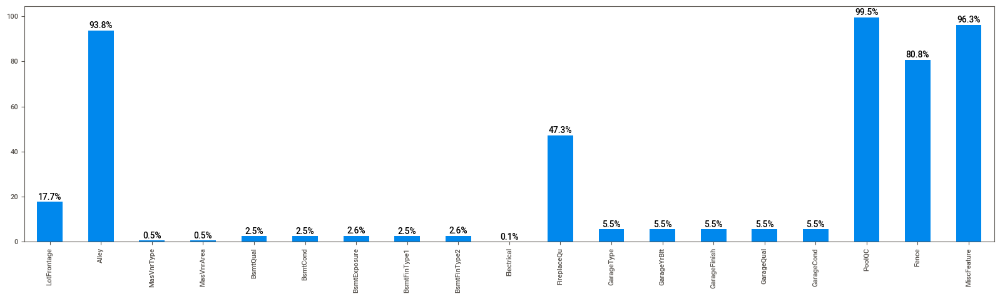

In [32]:
plt.figure(figsize=(20,5),facecolor='white')
null_values = data.isnull().sum()/len(data)*100
null_values = null_values[null_values > 0]
graph = null_values.plot.bar() 

for p in graph.patches:
    graph.annotate('{:.1f}%'.format(p.get_height()), (p.get_x()+0.25, p.get_height()+1), ha = 'center', weight = 'bold')

plt.show()

Out of 1460 records, we find the null values of features Alley, PoolQC, Fence and MiscFeature are greater than 80% so we drop these columns

In [33]:
data.drop(columns = ['Id'], axis = 1, inplace = True)

## Handling Null Values

--> Handling Numerical Null Features

In [34]:
Numerical_Null_Values = data[['LotFrontage', 'MasVnrArea', 'GarageYrBlt']]

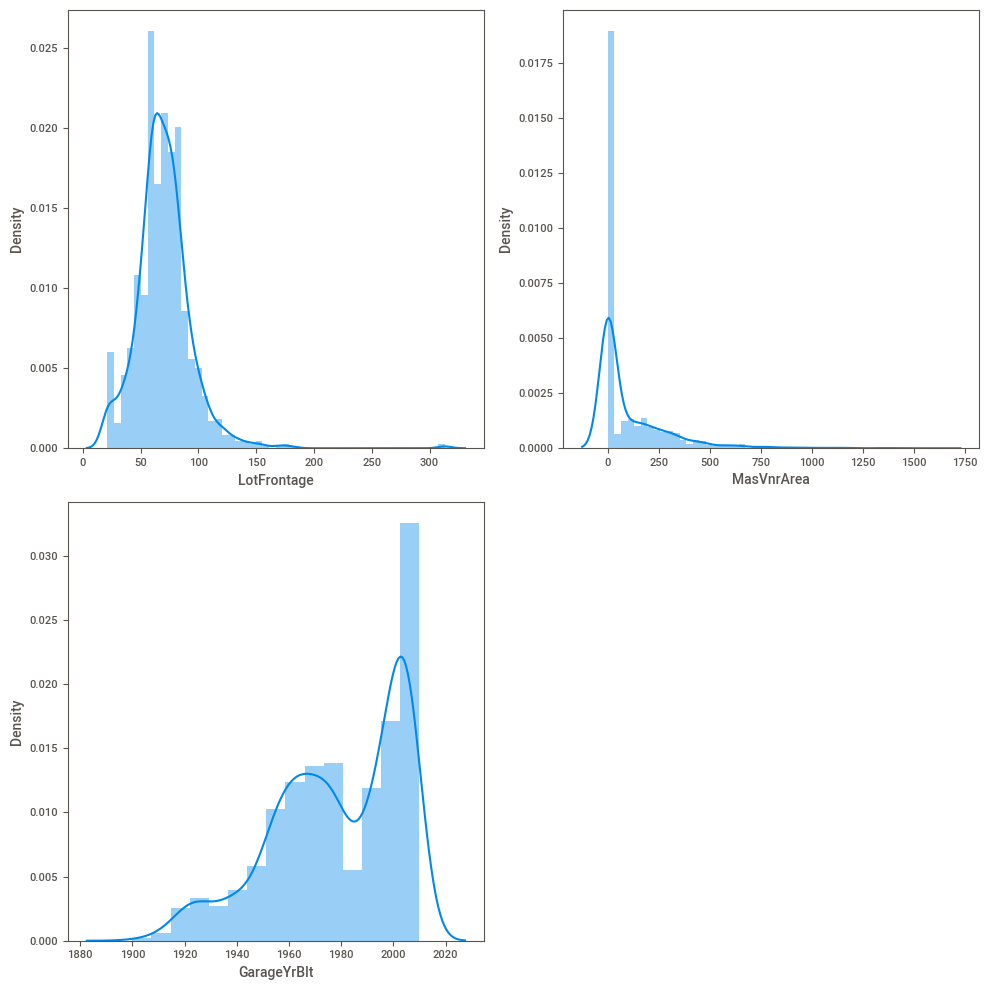

In [35]:
plt.figure(figsize = (10,10))
plotnumber = 1
for column in Numerical_Null_Values:
    if plotnumber<=4:
        ax = plt.subplot(2,2,plotnumber)
        sns.distplot(x = Numerical_Null_Values[column])
        plt.xlabel(column, fontsize = 10)
    plotnumber+=1
plt.tight_layout()

Replacing Numerical Null Values with Median

In [36]:
for i in Numerical_Null_Values:
    data[i].fillna(data[i].median(), inplace = True)

--> Handling Categorical Null Features

In [37]:
Categorical_Null_Values = data[['MasVnrType', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Electrical', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond']]

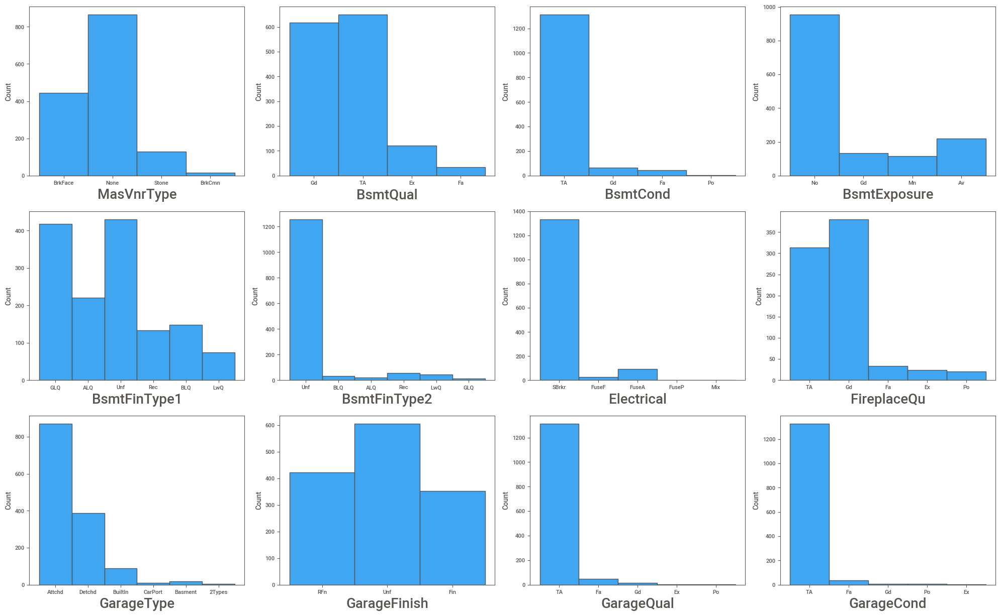

In [38]:
plt.figure(figsize = (20,20))
plotnumber = 1
for column in Categorical_Null_Values:
    if plotnumber<=20:
        ax = plt.subplot(5,4,plotnumber)
        sns.histplot(x = Categorical_Null_Values[column])
        plt.xlabel(column, fontsize = 20)
    plotnumber+=1
plt.tight_layout()

Replacing Numerical Null Values with Median

In [39]:
for i in Categorical_Null_Values:
    data[i].fillna(data[i].mode()[0], inplace = True)

###### Categorical features with greater than 80%

In [40]:
Greater_Categorical_Null_Values = data[['Alley','PoolQC', 'Fence', 'MiscFeature']]

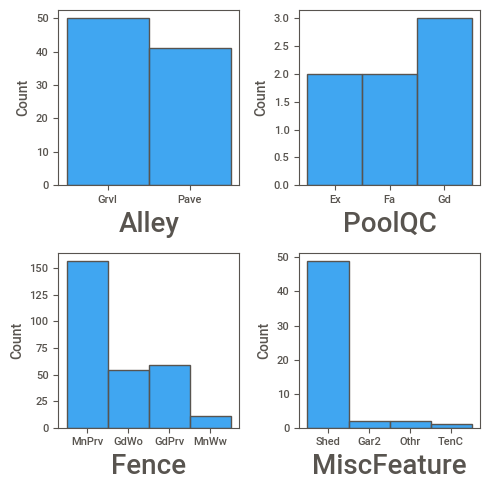

In [41]:
plt.figure(figsize = (5,5))
plotnumber = 1
for column in Greater_Categorical_Null_Values:
    if plotnumber<=4:
        ax = plt.subplot(2,2,plotnumber)
        sns.histplot(x = Greater_Categorical_Null_Values[column])
        plt.xlabel(column, fontsize = 20)
    plotnumber+=1
plt.tight_layout()

In [42]:
data['Alley'].fillna('No Alley', inplace = True)
data['PoolQC'].fillna('No Pool', inplace = True)
data['Fence'].fillna('No Fence', inplace = True)
data['MiscFeature'].fillna('None', inplace = True)

# Converting Categorical features to Numeric using Labelencoding

In [43]:
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()

In [44]:
Categorical_Features = list(data.select_dtypes(include = 'object').columns)

In [45]:
for column in Categorical_Features:
    data[column] = label_encoder.fit_transform(data[column])

# Correlation Matrix

<AxesSubplot:>

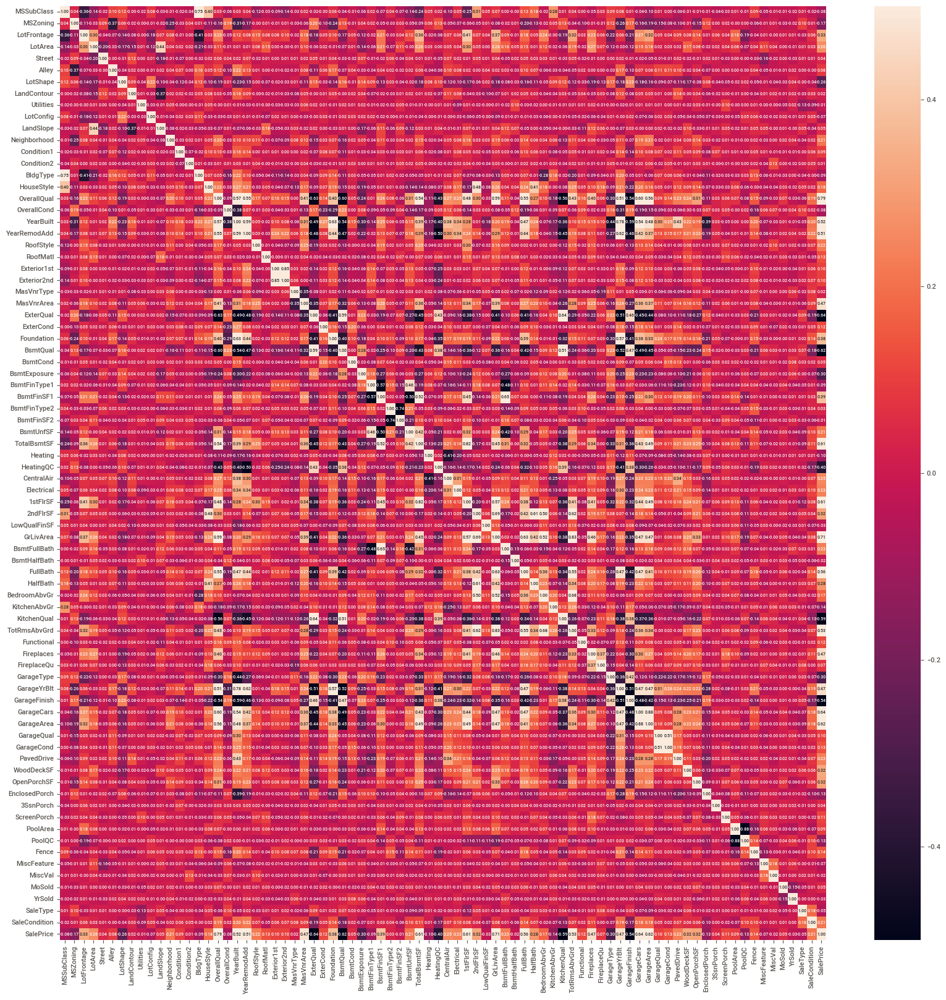

In [46]:
plt.figure(figsize = (20,20))
sns.heatmap(data.corr(), cbar = True, vmin = -0.5, vmax = 0.5, fmt = '.2f', annot_kws = {'size':5}, annot = True)

<AxesSubplot:>

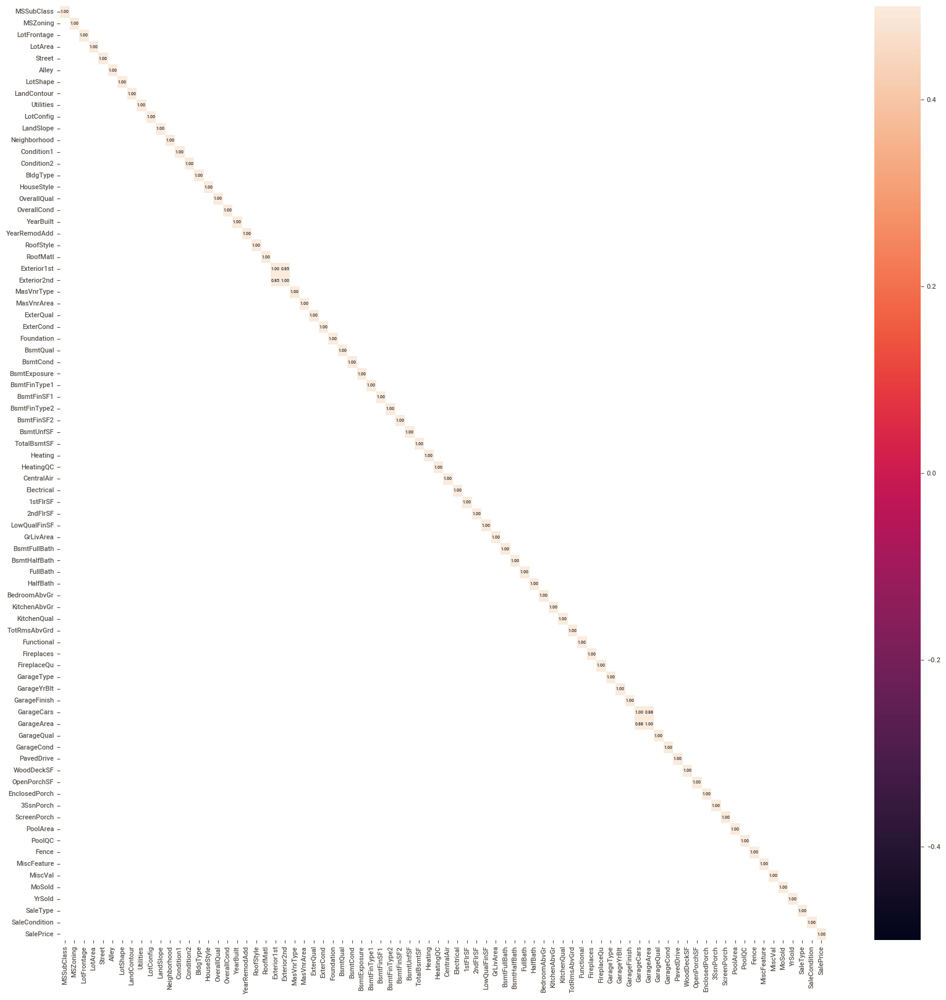

In [47]:
cor = data.corr()
kot=cor[cor>=0.85]
plt.figure(figsize=(20,20))
sns.heatmap(kot,cbar = True, vmin = -0.5, vmax = 0.5, fmt = '.2f', annot_kws = {'size':5}, annot = True)

# Box Plot

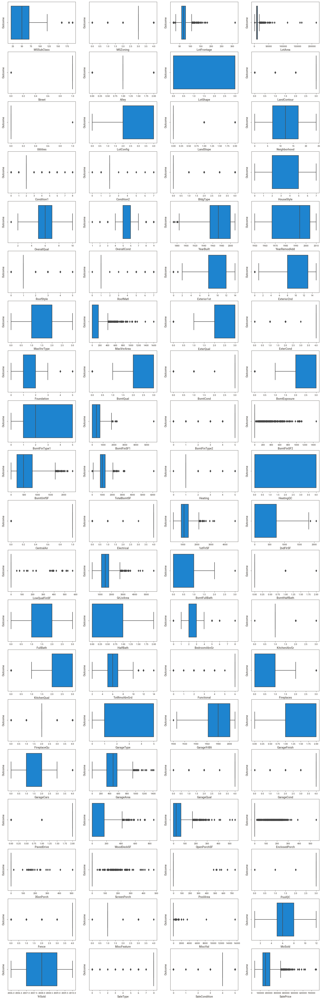

In [48]:
plt.figure(figsize = (20,65), facecolor = 'white')
plotnumber = 1
for column in data.columns:
    if plotnumber <= 100:
        ax = plt.subplot (20, 4, plotnumber)
        sns.boxplot(x = data[column])
        plt.xlabel(column, fontsize = 10)
        plt.ylabel('Outcome', fontsize = 10)
    plotnumber += 1
plt.show()

# Splitting data and performing Standard Scaler

In [49]:
X = data.drop('SalePrice',axis=1)
y = data['SalePrice']

In [50]:
#scaling the data
from sklearn.preprocessing import StandardScaler 
scalar = StandardScaler()
X_scaled = scalar.fit_transform(X)

#### Dividing the x and y data as train and test using train_test_split method

In [51]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X_scaled,y,test_size=0.2,random_state=42)

# Modelling

In [52]:
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import GradientBoostingRegressor
from xgboost import XGBRegressor
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import SGDRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor

In [53]:
# Object Creation
models = {
    'SVR':SVR(),
    'GBRegressor':GradientBoostingRegressor(),
    'XGBRegressor':XGBRegressor(),
    'Ridge':Ridge(),
    'Lasso':Lasso(),
    'ElasticNet':ElasticNet(),
    'SGDRegressor':SGDRegressor(),
    'LinearRegression':LinearRegression(),
    'RandomForestRegressor':RandomForestRegressor(),
    'KNeighborsRegressor':KNeighborsRegressor(),
    'DecisionTreeRegressor':DecisionTreeRegressor(),
    'PolynomialFeatures':LinearRegression()
}  

Regression Metrics

In [54]:
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error

Model Result

In [55]:
model_names = []
model_r_squared_train = []
model_r_squared_test = []
model_adjusted_r = []
model_mae=[]
model_mse=[]
model_rmse=[]


for name,model in models.items():
    a = model.fit(X_train,y_train)
    predicted_train = a.predict(X_train)
    predicted = a.predict(X_test)
    r_squared_train = r2_score(y_train, predicted_train)
    r_squared_test = r2_score(y_test, predicted)
    adjusted_r2 = 1-(1-r_squared_test)*(292-1)/(292-80-1)
    mae = mean_absolute_error(y_test, predicted)
    mse = mean_squared_error(y_test, predicted)
    rmse = np.sqrt(mean_squared_error(y_test, predicted))
    model_names.append(name)
    model_r_squared_train.append(r_squared_train)
    model_r_squared_test.append(r_squared_test)
    model_adjusted_r.append(adjusted_r2)
    model_mae.append(mae)
    model_mse.append(mse)
    model_rmse.append(rmse)
   
# creating dataframe
    df_results = pd.DataFrame([model_names,model_r_squared_train,model_r_squared_test,model_adjusted_r,model_mae,model_mse,model_rmse])
    df_results = df_results.transpose()
    df_results = df_results.rename(columns={0:'Model',1:'R2_Score_Train',2: 'R2_Score_test', 3: 'Adjusted_R2_Score', 4:"MAE",5:"MSE",6:"RMSE"})
    
df_results

,Model,R2_Score_Train,R2_Score_test,Adjusted_R2_Score,MAE,MSE,RMSE
0,SVR,-0.044567,-0.024303,-0.412664,59530.074245,7856738496.505548,88638.245112
1,GBRegressor,0.968318,0.897956,0.859266,16957.49989,782712936.206396,27977.007278
2,XGBRegressor,0.999833,0.905876,0.870189,17164.229853,721963722.567719,26869.382623
3,Ridge,0.854208,0.842084,0.782211,21731.255464,1211265115.646446,34803.23427
4,Lasso,0.854209,0.841976,0.782061,21739.894024,1212098804.025326,34815.209378
5,ElasticNet,0.835083,0.839435,0.778557,20389.648994,1231585738.062543,35093.955862
6,SGDRegressor,0.834521,0.813861,0.743288,22762.42079,1427743506.19908,37785.49333
7,LinearRegression,0.854194,0.841904,0.781963,21747.045078,1212645249.062311,34823.056285
8,RandomForestRegressor,0.980397,0.89239,0.85159,17658.72137,825403460.64082,28729.835722
9,KNeighborsRegressor,0.817243,0.791694,0.712715,23535.087671,1597776467.425479,39972.19618


1. Using multiple models, we have predicted the House price and as per the above model results we observe XGB Regressor is the best model.

2. We also observe that RMSE value of XGB is reduced, and to reduce further we can use Hyper Prameter Tuning

### Hyper Parameter Tuning for XGB Regressor

In [56]:
from sklearn.model_selection import RandomizedSearchCV

param_grid = {'gamma': [0,0.1,0.2,0.4,0.8,1.6,3.2,6.4,12.8,25.6,51.2,102.4, 200],
              'learning_rate': [0.01, 0.03, 0.06, 0.1, 0.15, 0.2, 0.25, 0.300000012, 0.4, 0.5, 0.6, 0.7],
              'max_depth': [5,6,7,8,9,10,11,12,13,14],
              'n_estimators': [50,65,80,100,115,130,150],
              'reg_alpha': [0,0.1,0.2,0.4,0.8,1.6,3.2,6.4,12.8,25.6,51.2,102.4,200],
              'reg_lambda': [0,0.1,0.2,0.4,0.8,1.6,3.2,6.4,12.8,25.6,51.2,102.4,200]}

XGB=XGBRegressor(random_state=42,verbosity=0,silent=0)
rcv= RandomizedSearchCV(estimator=XGB, scoring=None,param_distributions=param_grid, n_iter=100, cv=3, 
                               verbose=2, random_state=42, n_jobs=-1)

rcv.fit(X_train, y_train)
cv_best_params = rcv.best_params_ 
print(f"Best paramters: {cv_best_params})")

Fitting 3 folds for each of 100 candidates, totalling 300 fits
Best paramters: {'reg_lambda': 0.4, 'reg_alpha': 200, 'n_estimators': 150, 'max_depth': 5, 'learning_rate': 0.2, 'gamma': 0.1})


In [57]:
XGB2=XGBRegressor(reg_lambda= 0.4, reg_alpha= 200, n_estimators=150, max_depth=5, learning_rate=0.2, gamma=0.1)
XGB2.fit(X_train, y_train)
y_predict=XGB2.predict(X_test)
tuned_r2_score=r2_score(y_test,y_predict)

In [58]:
print(tuned_r2_score)

0.9166607651982618


# Conclusion

The given dataset was a Supervised Regression prediction of House Price, and the data was imported to Jupiter notebook using Pandas library. We had gone through the features of the dataset. Now the dataset is ready to fed into the regressor and this was achieved by replacing null values and converting categorical features. The data set was split into Training and Testing set.

Algorithms and Tuning Parameters used to determine the Liver Patient Prediction:
1. Support Vector Regressor
2. Gradient Boosting Regressor
3. Extreme Gradient Boosting Regressor
4. Ridge Regressor
5. Lasso Regressor
6. Elastic Net
7. SGD Regressor
8. Linear Regresson
9. Random Forest Regressor
10. K Nearest Neighbours
11. Decision Tree
12. Polynomial Features

Compared to all the models Extreme Gradient Boosting Regressor is giving the best R2 Score and also Lowest RMSE value and we conclude XGB model prediction as final.